In [123]:
from simulation_plotters import *
from simulation_experiments import *
from ddq_circuit_generators import *
from helpers import *
import numpy as np

#This sets the seed for random sampling to be constant such that randomly sampling from an identical distribution twice will always produce identical samples.
np.random.seed(seed=231321312)

%reload_ext autoreload
%aimport simulation_plotters
%aimport helpers
%aimport ddq_circuit_generators
%aimport simulation_experiments
%autoreload 2

## Case 1: Uniform Homogeneous Noise ##

In [19]:
## Setup Parameters ## 
d = [3, 5, 7, 9, 11, 13, 15, 17]

In [ ]:
## Run Simulation w/ Parameters ## 
homogeneous_uniform_stat = uniform_homogeneous_noise_model_simulation_distance(d) 

Saved plot as data/case1/homogeneous-d3-17-20251121_194752.png


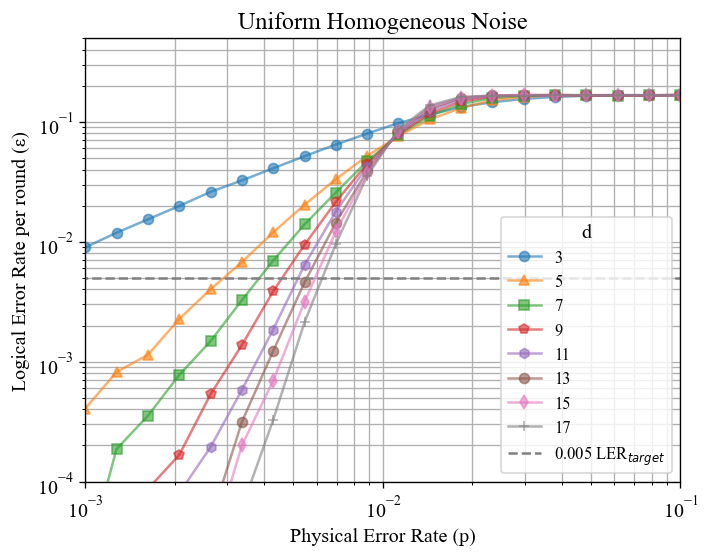

In [61]:
## Plot simulation data ## 
plot_simulation_data(homogeneous_uniform_stat, save_figure_path=f'case1/homogeneous-d{d[0]}-{d[7]}') 

In [ ]:
## Each simulation stats DF can be saved as a CSV in the \data folder under an existing or new experiment folder ##
# This function saves the underlying Pandas DF to a CSV in a subdirectory of the repository, /data. Within this data folder, you can specify additional subdirectories via the 'subfolder' parameter
stats_df_to_csv(df=homogeneous_uniform_stat, filename='case1-uniform-homogeneous-d3-17', subfolder='case1')

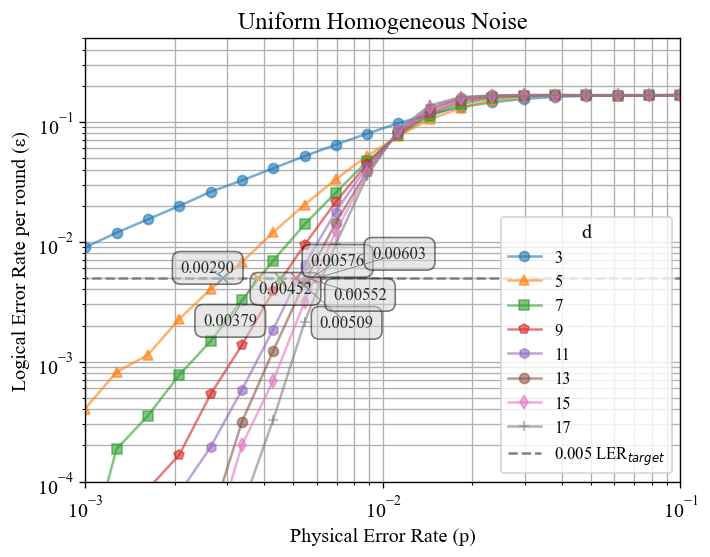

In [ ]:
## For each plot, the intersections with the ler target target can be shown and/or offloaded into a DataFrame for further use
case1_intersects = pd.DataFrame(columns=['distance', 'line', 'xy coord'])
plot_simulation_data(homogeneous_uniform_stat, show_intersect=True, intersect_df=case1_intersects)
case1_intersects.head()

# The intersections can also be saved as a cvs, similar to the data used to generate a specific plot with the following:
stats_df_to_csv(case1_intersects, 'case1-intersects', 'case1')

## Case 2: Homogeneous Noise With Center Defect ##

In [63]:
## Setup Parameters ##
d = [3, 5, 7, 9, 11, 13, 15, 17]
p_defect_values = [0.0, 0.05, 0.25, 0.50, 0.75]

In [70]:
## Run Simulation w/ Parameters (Estimated Runtime: ~ 6 Minutes) ## 
homogeneous_model_stat = [homogeneous_noise_model_simulation(d[:4], p_defect_values=p_defect_values, defect_type='center data'),
                          homogeneous_noise_model_simulation(d[4:], p_defect_values=p_defect_values, defect_type='center data')]


Saved plot as data/case2/homogeneous-defect-d3-9-20251121_203809.png
Saved plot as data/case2/homogeneous-defect-d11-17-20251121_203810.png


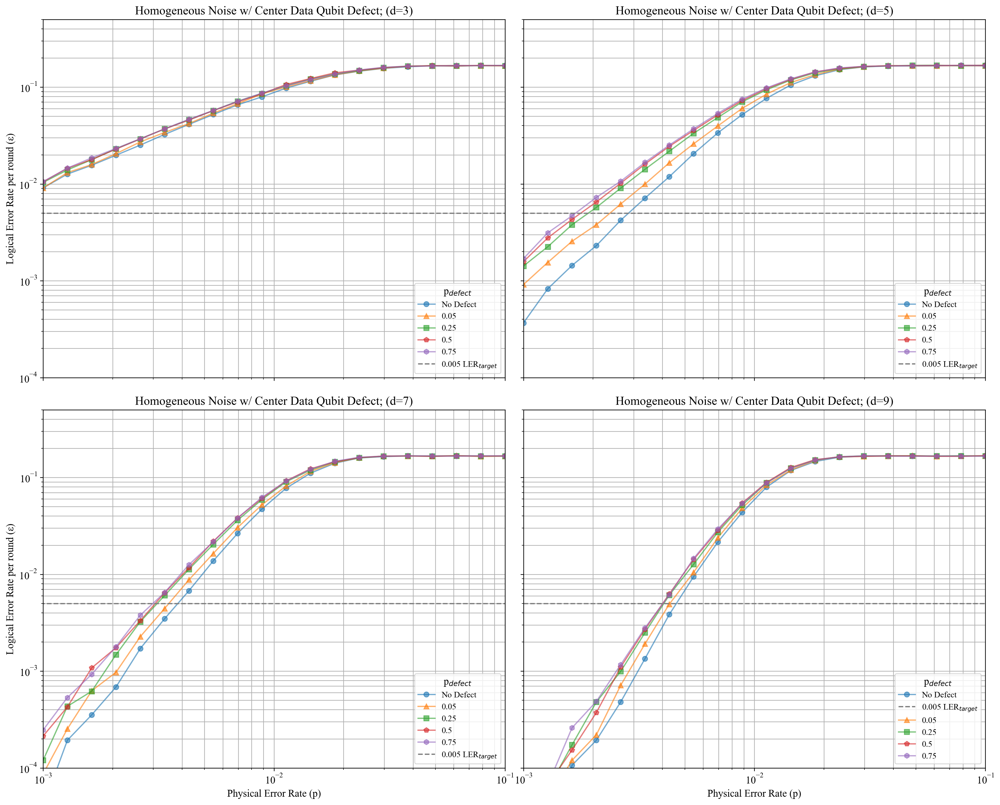

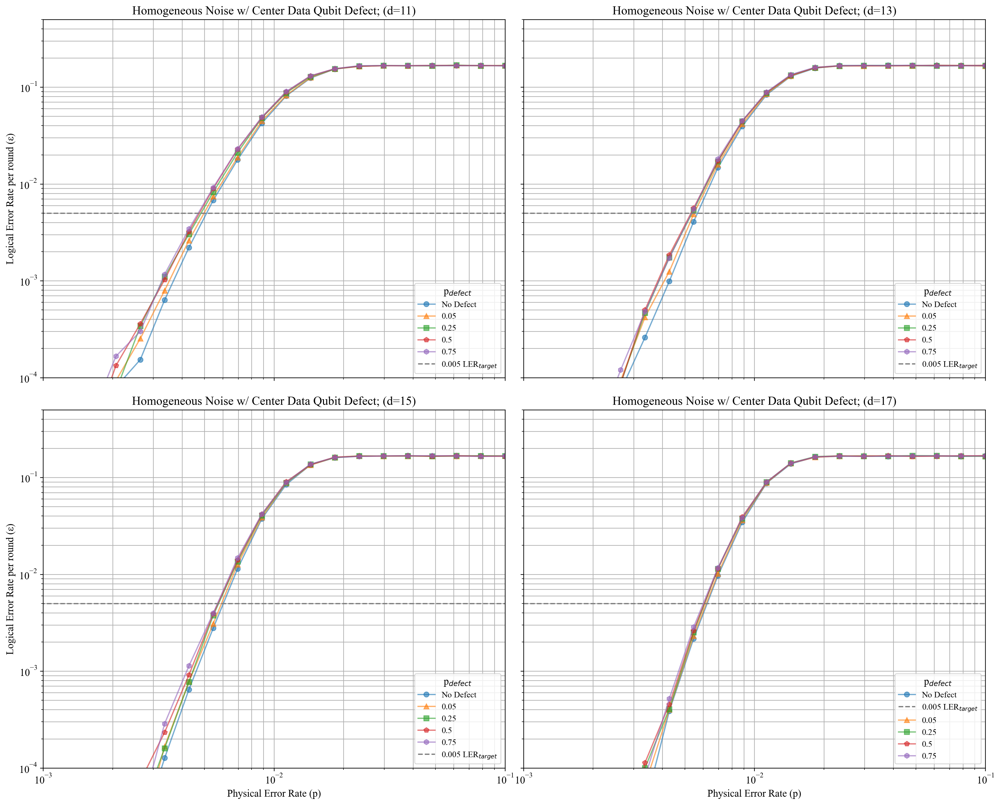

In [74]:
## Plot simulation data ##
plot_multi_distance_simulation_data(homogeneous_model_stat[0], save_figure_path=f'case2/homogeneous-defect-d{d[0]}-{d[3]}')
plot_multi_distance_simulation_data(homogeneous_model_stat[1], save_figure_path=f'case2/homogeneous-defect-d{d[4]}-{d[7]}')

is list


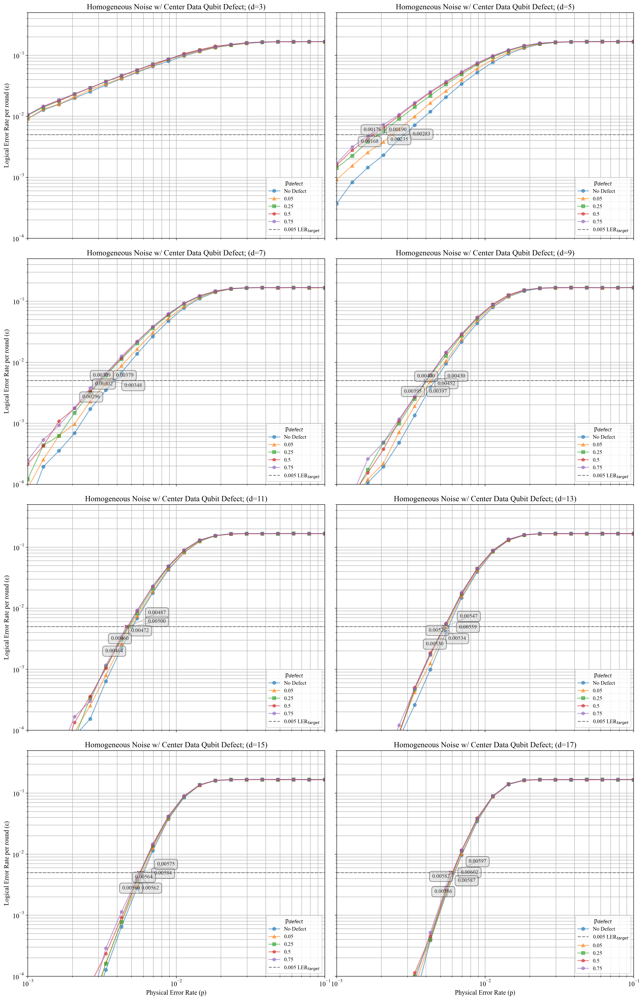

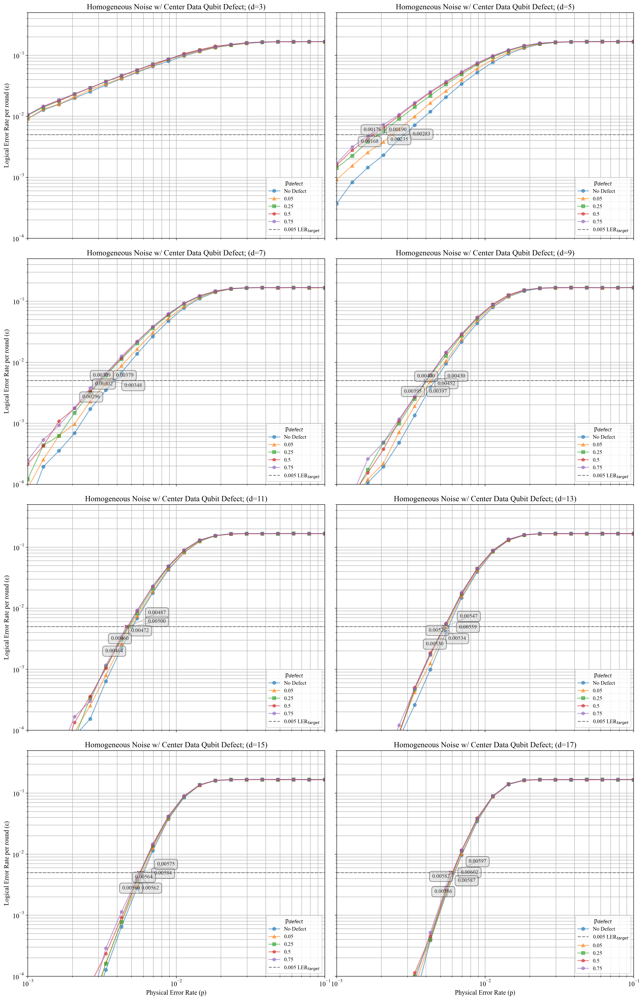

In [ ]:
# case_results = [*homogeneous_model_stat[0], *homogeneous_model_stat[1]]
# ## Save simulation results ##
# stats_df_to_csv(df=case_results, filename='case2-uniform-homogeneous-d3-17', subfolder='case2')

# case2_intersects = pd.DataFrame(columns=['distance', 'line', 'xy coord'])
# plot_multi_distance_simulation_data(case_results, show_intersect=True, intersect_df=case2_intersects)
# plot_multi_distance_simulation_data(case_results, show_intersect=True, intersect_df=case2_intersects)
# stats_df_to_csv(case2_intersects, 'case2-intersects', 'case2')

## Case 3: Heterogeneous Noise ##

In [23]:
## Setup Parameters ##
d = [3, 5, 7, 9, 11, 13, 15, 17]
alpha_scalar = [0.0, 0.01, 0.3, 0.6, 0.9]

In [24]:
np.random.seed(seed=6275917)
## Run Simulation w/ Parameters (Estimated Runtime: ~ 5 Minutes) ## 
heterogeneous_model_stat = [heterogeneous_noise_model_simulation(d[:4], p_sigma_values=alpha_scalar, use_p_sigma_values_as_scalars=True),
                            heterogeneous_noise_model_simulation(d[4:], p_sigma_values=alpha_scalar, use_p_sigma_values_as_scalars=True)]

Saved plot as data/case3/heterogeneous-d3-9-20251122_094603.png
Saved plot as data/case3/heterogeneous-d11-17-20251122_094603.png


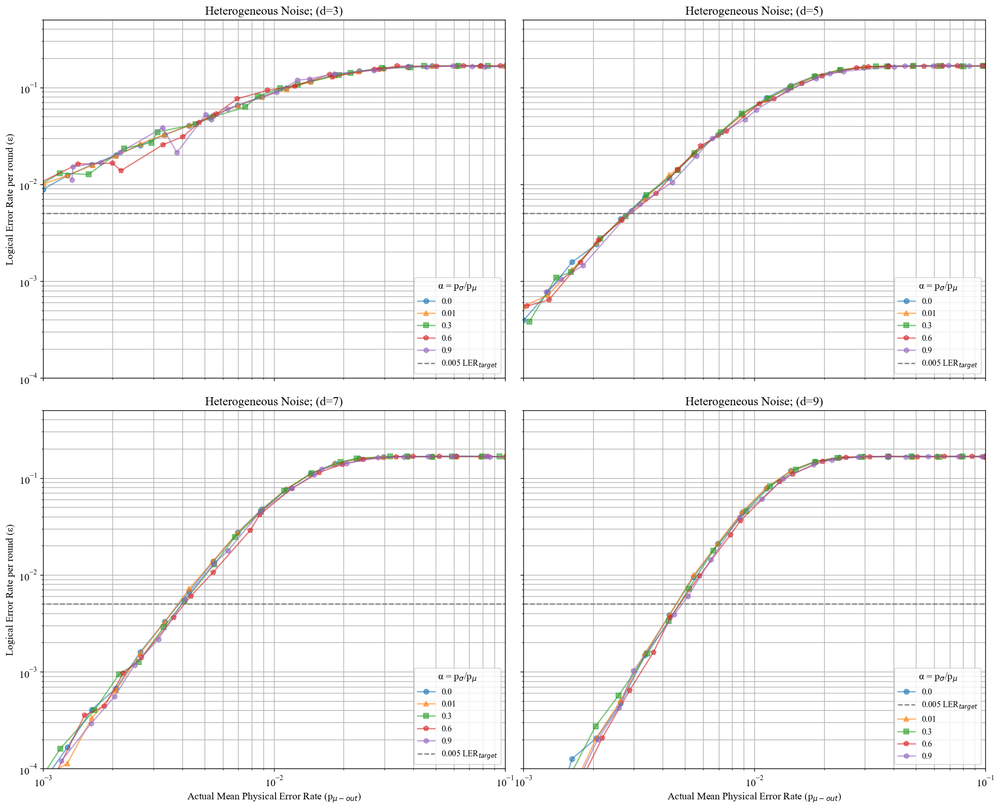

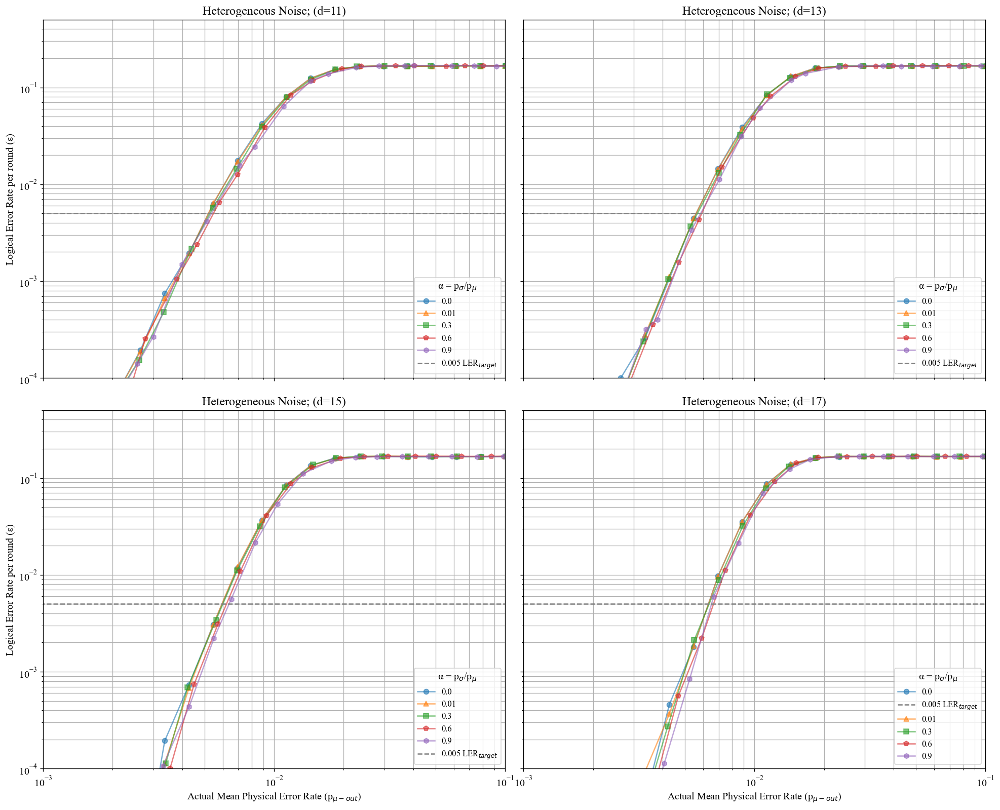

In [33]:
## Plot simulation data ##
plot_multi_distance_simulation_data(heterogeneous_model_stat[0], x_range=[10**(-3), 10**(-1)], save_figure_path=f'case3/heterogeneous-d{d[0]}-{d[3]}')
plot_multi_distance_simulation_data(heterogeneous_model_stat[1], x_range=[10**(-3), 10**(-1)], save_figure_path=f'case3/heterogeneous-d{d[4]}-{d[7]}')

In [26]:
case3_df = concat_stats_df([*heterogeneous_model_stat[0], *heterogeneous_model_stat[1]])
case3_df

,p_sigma,p_mu,p_sig_scalar,distance,rounds,shots,errors,ler_shot,mu_out,sigma_out,ler_round,noise_model
0,0.000382,0.001274,0.30,3,3,50000,1959,0.03918,0.001183,4.361094e-04,0.013060,heterogeneous-sig-scalar
1,0.000013,0.001274,0.01,3,3,50000,1849,0.03698,0.001275,1.725215e-05,0.012327,heterogeneous-sig-scalar
2,0.001147,0.001274,0.90,3,3,50000,2269,0.04538,0.001348,9.594966e-04,0.015127,heterogeneous-sig-scalar
3,0.000765,0.001274,0.60,3,3,50000,2425,0.04850,0.001413,6.892345e-04,0.016167,heterogeneous-sig-scalar
4,0.000016,0.001624,0.01,3,3,50000,2362,0.04724,0.001635,1.542058e-05,0.015747,heterogeneous-sig-scalar
...,...,...,...,...,...,...,...,...,...,...,...,...
795,0.000000,0.100000,0.00,17,3,50000,25065,0.50130,0.100000,1.387779e-17,0.167100,heterogeneous-sig-scalar
796,0.001000,0.100000,0.01,17,3,50000,24929,0.49858,0.099979,1.021306e-03,0.166193,heterogeneous-sig-scalar
797,0.030000,0.100000,0.30,17,3,50000,24936,0.49872,0.099252,2.996393e-02,0.166240,heterogeneous-sig-scalar
798,0.060000,0.100000,0.60,17,3,50000,25056,0.50112,0.104104,5.305523e-02,0.167040,heterogeneous-sig-scalar


Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


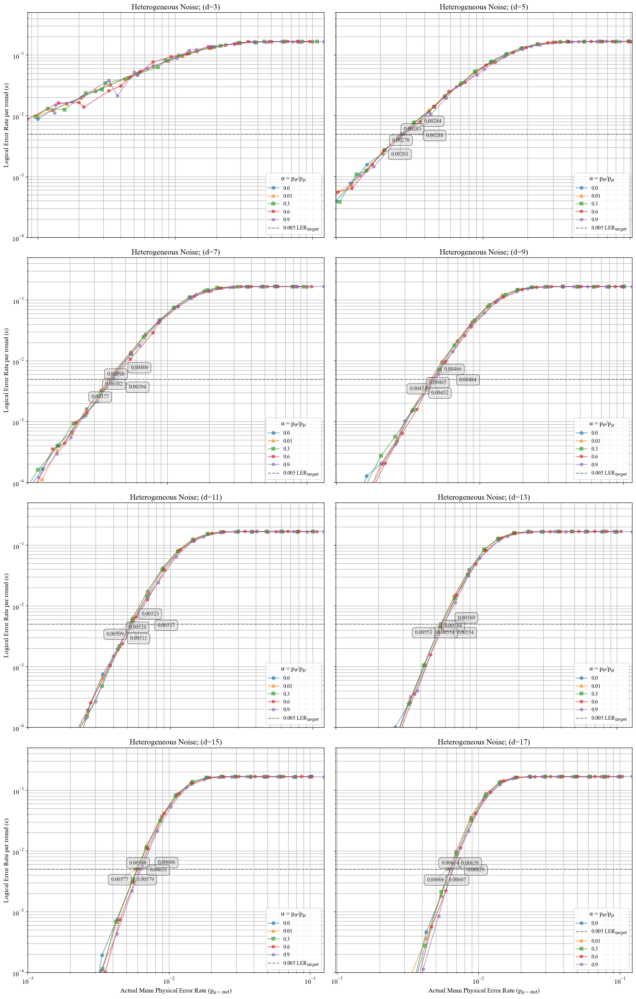

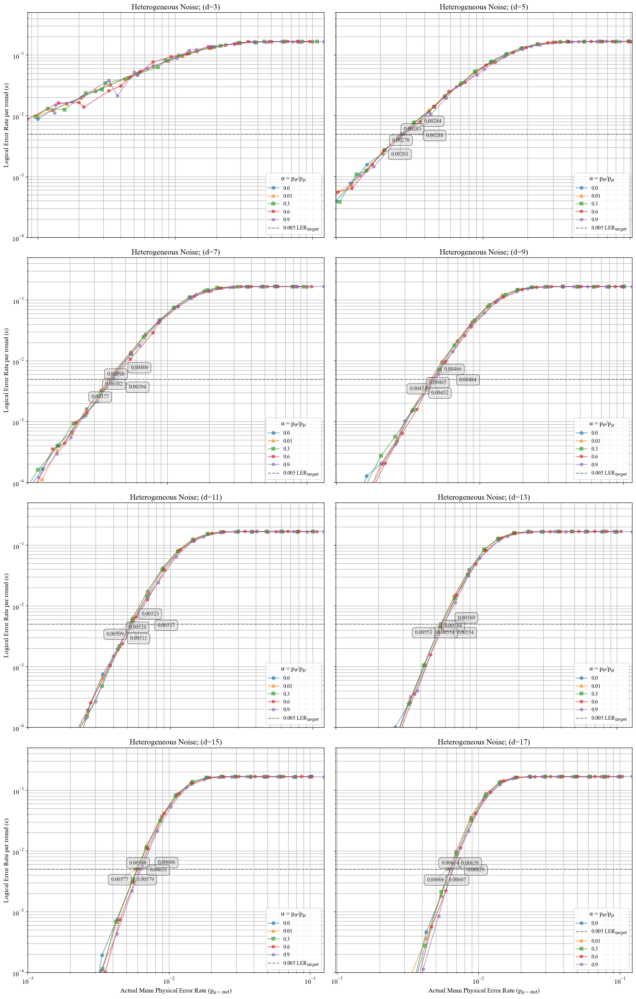

In [27]:
case_results = [*heterogeneous_model_stat[0], *heterogeneous_model_stat[1]]
## Save simulation results ##
stats_df_to_csv(df=case_results, filename='case3-heterogeneous-d3-17', subfolder='case3')

case_intersects = pd.DataFrame(columns=['distance', 'line', 'xy coord'])
plot_multi_distance_simulation_data(case_results, show_intersect=True, intersect_df=case_intersects)
plot_multi_distance_simulation_data(case_results, show_intersect=True, intersect_df=case_intersects)
stats_df_to_csv(case_intersects, 'case3-intersects', 'case3')

## Case 4: Heterogeneous Noise With Center Defect ##

In [28]:
## Setup Parameters ##
d = [3, 5, 7, 9, 11, 13, 15, 17]
alpha_scalar = 0.6
p_defect_values = [0.0, 0.05, 0.25, 0.50, 0.75]
defect_type = 'center data'

In [29]:
single_defect = heterogeneous_noise_model_with_defect_simulation([3,5], scalar=alpha_scalar, use_p_sigma_values_as_scalars=True, p_defect_values=p_defect_values, defect_type=defect_type)

In [ ]:
np.random.seed(seed=76541532)

## Run Simulation w/ Parameters (Estimated Runtime: ~ 5 Minutes) ## 
heterogeneous_defect_model_stat = [heterogeneous_noise_model_with_defect_simulation(d[:4], scalar=alpha_scalar, use_p_sigma_values_as_scalars=True, p_defect_values=p_defect_values, defect_type=defect_type),
                                   heterogeneous_noise_model_with_defect_simulation(d[4:], scalar=alpha_scalar, use_p_sigma_values_as_scalars=True, p_defect_values=p_defect_values, defect_type=defect_type)]

Saved plot as data/case4/heterogeneous-defect-d3-9-20251122_094810.png
Saved plot as data/case4/heterogeneous-defect-d11-17-20251122_094810.png


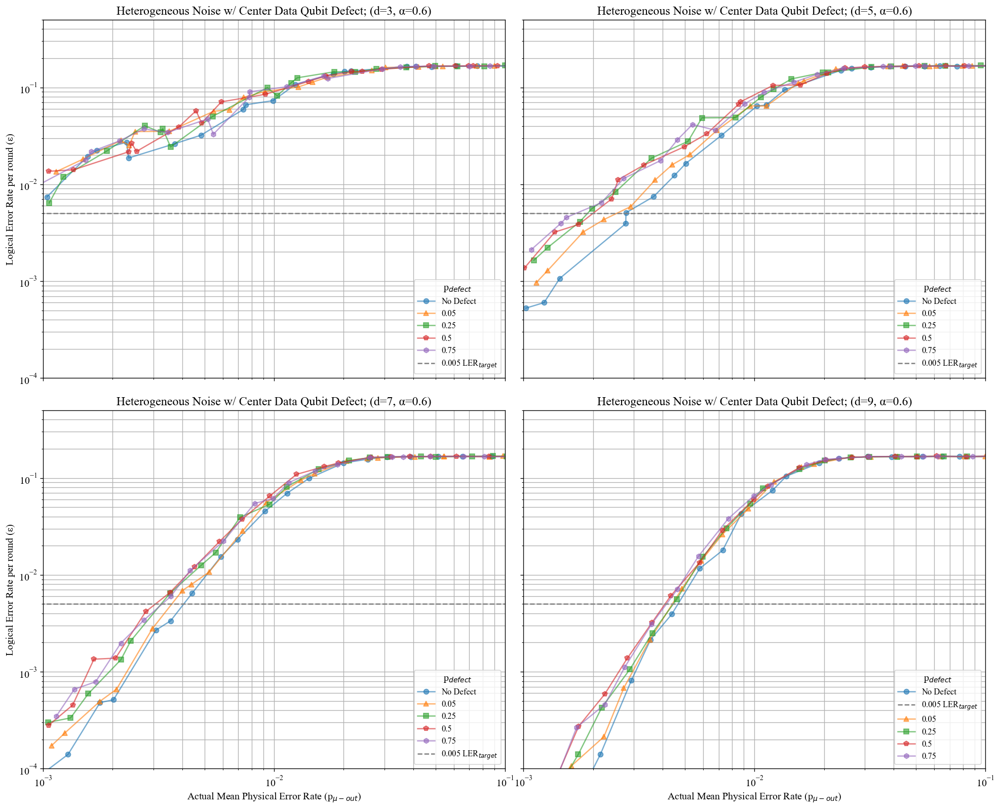

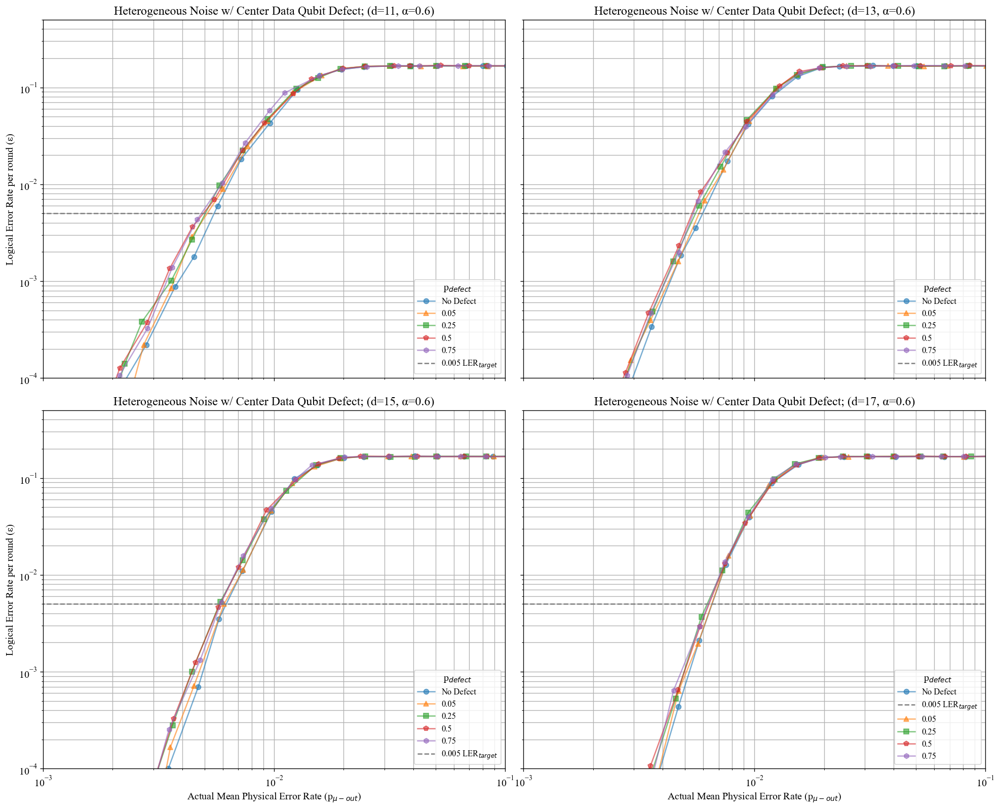

In [35]:

## Plot simulation data ##
plot_multi_distance_simulation_data(heterogeneous_defect_model_stat[0], x_range=[10**(-3), 10**(-1)], save_figure_path=f'case4/heterogeneous-defect-d{d[0]}-{d[3]}')
plot_multi_distance_simulation_data(heterogeneous_defect_model_stat[1], x_range=[10**(-3), 10**(-1)], save_figure_path=f'case4/heterogeneous-defect-d{d[4]}-{d[7]}')

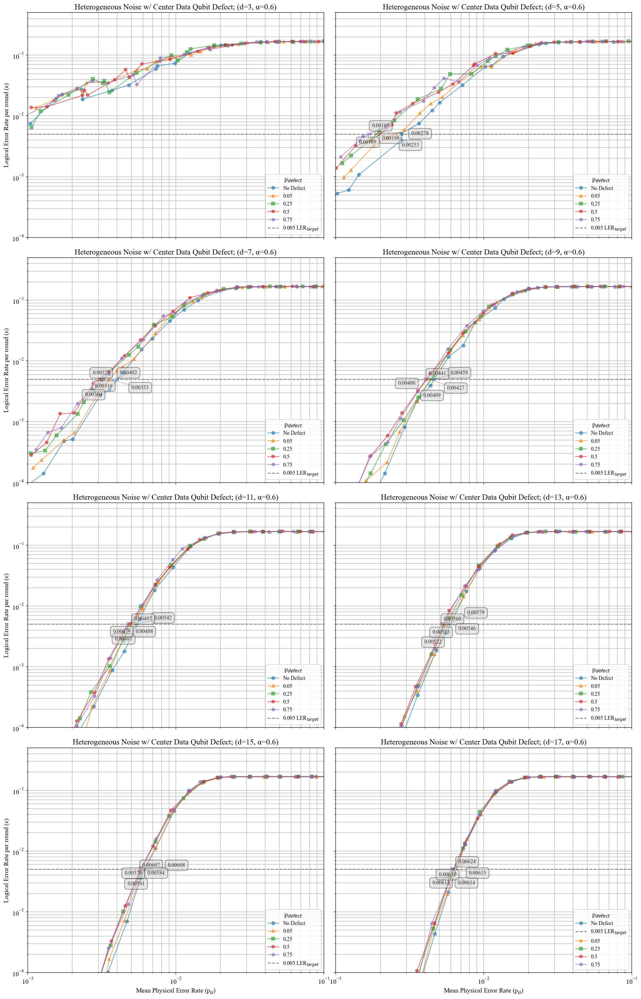

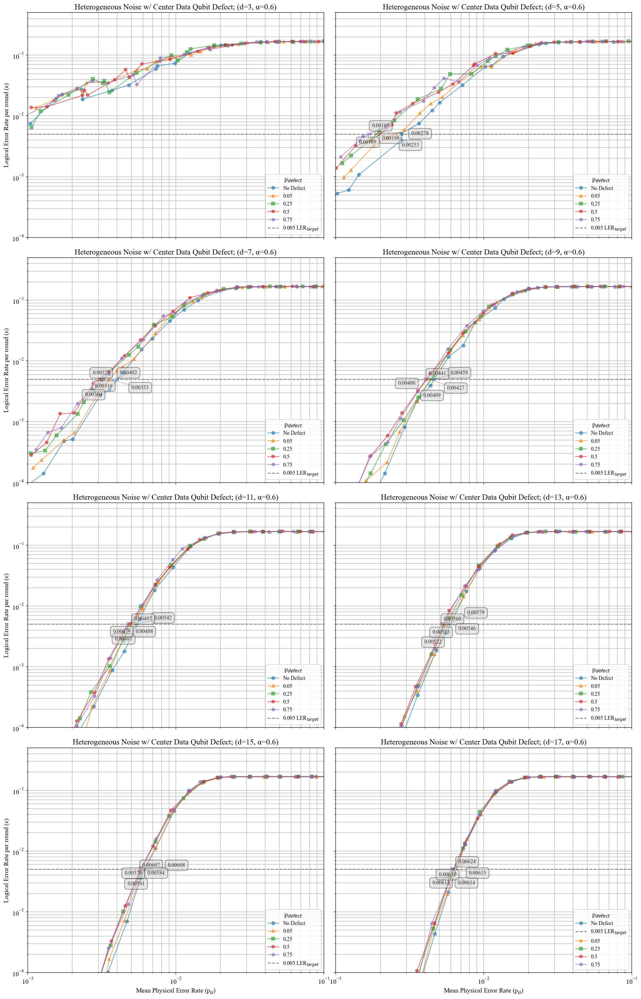

In [32]:
case_results = [*heterogeneous_defect_model_stat[0], *heterogeneous_defect_model_stat[1]]
## Save simulation results ##
stats_df_to_csv(df=case_results, filename='case4-heterogeneous-defect-d3-17', subfolder='case4')

case_intersects = pd.DataFrame(columns=['distance', 'line', 'xy coord'])
plot_multi_distance_simulation_data(case_results, show_intersect=True, intersect_df=case_intersects)
plot_multi_distance_simulation_data(case_results, show_intersect=True, intersect_df=case_intersects)
stats_df_to_csv(case_intersects, 'case4-intersects', 'case4')